## Breaking Audio into Segments

In [1]:
from pydub import AudioSegment

C:\ProgramData\Anaconda3\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
audio = AudioSegment.from_wav("akbar_1.wav") 
from IPython.display import Audio
import numpy as np
import matplotlib.pyplot as plt
Audio('akbar_1.wav')

In [3]:
n = len(audio) 
counter = 1
fh = open("new.txt", "w+")
interval = 5 * 1000
overlap = 1.5 * 1000
start = 0
end = 0
flag=0
for i in range(0, 2 * n, interval): 
    if i == 0: 
        start = 0
        end = interval 
    else: 
        start = end - overlap 
        end = start + interval  
    if end >= n: 
        end = n 
        flag = 1
    chunk = audio[start:end] 
    filename = 'C:/Users/Gowri/Desktop/speech repitition/audiochunk/chunk'+str(counter)+'.wav'
    chunk.export(filename, format ="wav") 
    print("Processing chunk "+str(counter)+". Start = "
                        +str(start)+" end = "+str(end)) 
    counter = counter + 1

Processing chunk 1. Start = 0 end = 5000
Processing chunk 2. Start = 3500.0 end = 8500.0
Processing chunk 3. Start = 7000.0 end = 12000.0
Processing chunk 4. Start = 10500.0 end = 15500.0
Processing chunk 5. Start = 14000.0 end = 19000.0
Processing chunk 6. Start = 17500.0 end = 22500.0
Processing chunk 7. Start = 21000.0 end = 24772
Processing chunk 8. Start = 23272.0 end = 24772
Processing chunk 9. Start = 23272.0 end = 24772
Processing chunk 10. Start = 23272.0 end = 24772


### Playing Audio Chunk

In [4]:
!pip install librosa 

In [5]:
import librosa
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
x, sr = librosa.load('akbar_1.wav', sr=16000)
ipd.Audio(x, rate=16000)


In [6]:
len(x)

396358

In [7]:
import librosa
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
x, sr = librosa.load('audiochunk/chunk2.wav', sr=16000)
ipd.Audio(x, rate=16000)


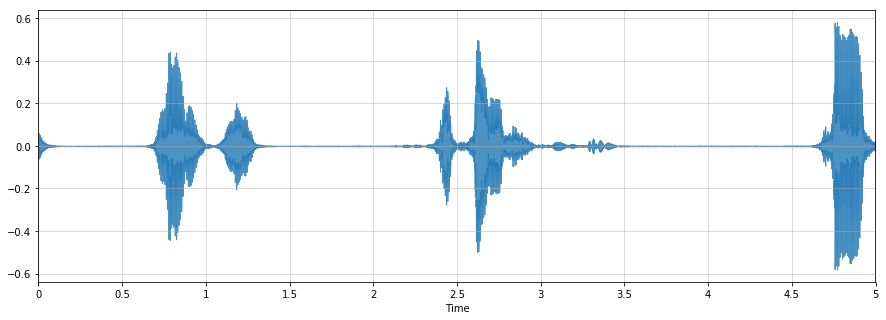

In [8]:
import librosa.display
plt.figure(figsize=(15, 5))
librosa.display.waveplot(x, sr, alpha=0.8)
plt.grid(alpha=0.6)

## Configuring Sample Rate of Audio to 16kHz

In [9]:
import librosa    
y, s = librosa.load('akbar_1.wav', sr=16000)

In [10]:
s

16000

## Plotting Audio In Visual format

In [11]:
import wave
import numpy as np
import matplotlib.pyplot as plt
signal_wave = wave.open('akbar_1.wav', 'r')
sample_rate = 16000
sig = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
sig = sig[:]

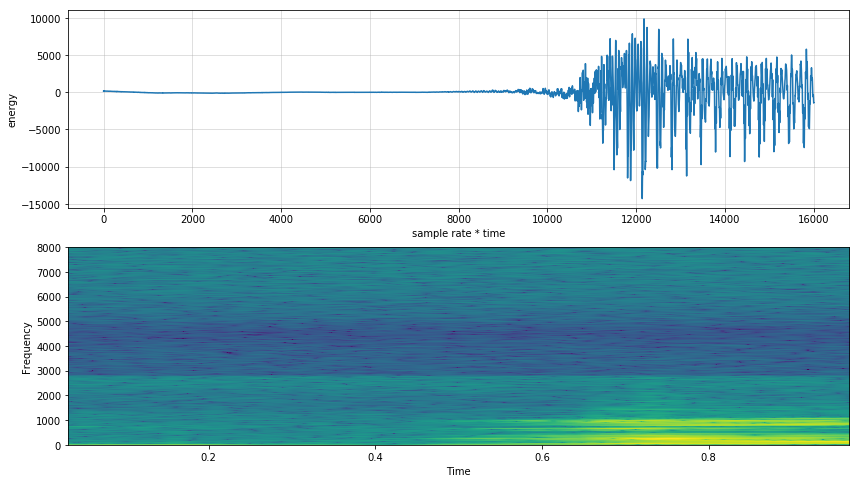

In [12]:
plt.figure(figsize=(14,8))
plt.figure(1)

plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')
plt.grid(alpha=0.5)

plot_b = plt.subplot(212)
plot_b.specgram(sig, NFFT=1024, Fs=16000, noverlap=1000)
plot_b.set_xlabel('Time')
plot_b.set_ylabel('Frequency')

plt.show()

### Pressure-Time plot i.e Waveform.

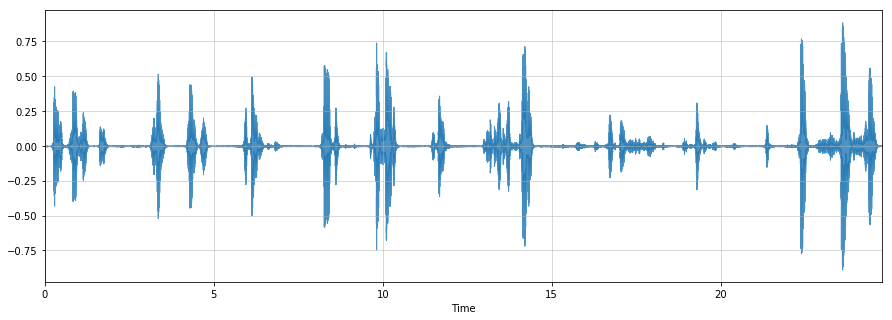

In [13]:
import librosa
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
x, sr = librosa.load('akbar_1.wav', sr=16000)
ipd.Audio(x, rate=16000)
import librosa.display
plt.figure(figsize=(15, 5))
librosa.display.waveplot(x, sr, alpha=0.8)
plt.grid(alpha=0.6)

### Compute the short-time Fourier transform:

In [14]:
import warnings
warnings.filterwarnings('ignore')

In [15]:
x, sr = librosa.load('akbar_1.wav')
X = librosa.stft(x)


In [16]:
Xmag = librosa.amplitude_to_db(X)

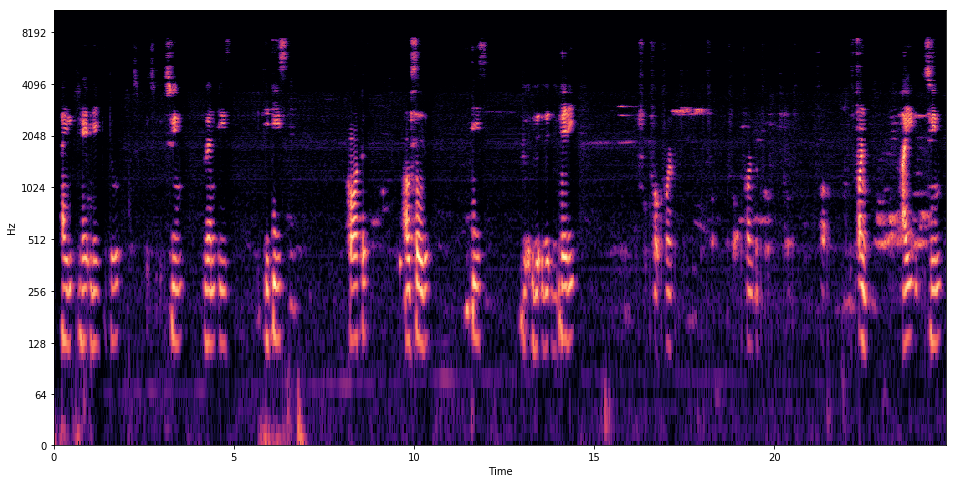

In [17]:
# Play with the parameters, including x_axis and y_axis
plt.figure(figsize=(16,8))
librosa.display.specshow(Xmag, sr=sr, x_axis='time', y_axis='log')

range(0, 1067)


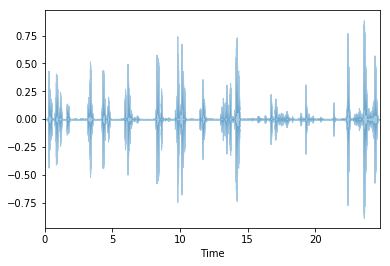

In [18]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
print(frames)
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)

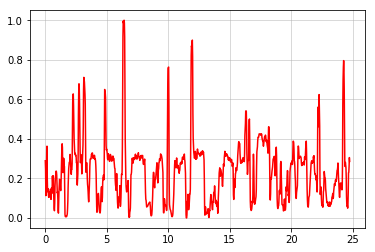

In [19]:
plt.plot(t, normalize(spectral_centroids), color='r')
plt.grid(alpha=0.6)

## Detect Onsets

In [20]:
onset_frames = librosa.onset.onset_detect(x, sr=sr)
print (onset_frames)


[  10   12   31   36   46   50   69   92   98  113  118  129  136  143
  183  185  199  253  255  263  272  285  352  354  357  370  420  424
  429  435  495  501  503  511  560  563  574  579  585  590  599  606
  608  701  714  720  728  734  783  789  807  814  830  841  847  858
  874  920  926  947  956  960  964 1002 1015 1032 1043 1048 1051]


In [21]:
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
print (onset_times)

[ 0.23219955  0.27863946  0.71981859  0.83591837  1.06811791  1.16099773
  1.60217687  2.13623583  2.27555556  2.62385488  2.73995465  2.99537415
  3.15791383  3.32045351  4.2492517   4.29569161  4.62077098  5.87464853
  5.92108844  6.10684807  6.31582766  6.61768707  8.17342404  8.21986395
  8.28952381  8.59138322  9.75238095  9.84526077  9.96136054 10.10068027
 11.49387755 11.63319728 11.67963719 11.86539683 13.0031746  13.07283447
 13.32825397 13.44435374 13.58367347 13.69977324 13.90875283 14.07129252
 14.11773243 16.27718821 16.57904762 16.71836735 16.90412698 17.04344671
 18.18122449 18.32054422 18.7385034  18.90104308 19.27256236 19.52798186
 19.66730159 19.92272109 20.29424036 21.36235828 21.501678   21.98929705
 22.19827664 22.29115646 22.38403628 23.26639456 23.56825397 23.9629932
 24.2184127  24.33451247 24.40417234]


In [22]:
onset_samples = librosa.frames_to_samples(onset_frames)
print (onset_samples)

[  5120   6144  15872  18432  23552  25600  35328  47104  50176  57856
  60416  66048  69632  73216  93696  94720 101888 129536 130560 134656
 139264 145920 180224 181248 182784 189440 215040 217088 219648 222720
 253440 256512 257536 261632 286720 288256 293888 296448 299520 302080
 306688 310272 311296 358912 365568 368640 372736 375808 400896 403968
 413184 416768 424960 430592 433664 439296 447488 471040 474112 484864
 489472 491520 493568 513024 519680 528384 534016 536576 538112]


In [23]:
# Use the `length` parameter so the click track is the same length as the original signal
clicks = librosa.clicks(times=onset_times, length=len(x))

In [24]:
# Play the click track "added to" the original signal
ipd.Audio(x+clicks, rate=sr)

## MFCC Festures

In [25]:
y, sr = librosa.load('akbar_1.wav')
m = librosa.feature.mfcc(y=y, sr=16000, n_mfcc=13)

In [26]:
mfccs = librosa.feature.mfcc(x, sr=16000)
print(mfccs.shape)

(20, 1067)


In [27]:
from IPython.display import Audio
Audio('akbar_1.wav')

In [28]:
m

array([[-550.3413   , -553.2891   , -553.7787   , ..., -522.6548   ,
        -524.0866   , -518.7235   ],
       [  13.6493845,   11.069435 ,   11.797069 , ...,   39.958363 ,
          35.98646  ,   42.452774 ],
       [   9.350956 ,    9.000051 ,   11.550995 , ...,   16.820438 ,
          11.988491 ,   16.29688  ],
       ...,
       [   9.870557 ,    8.452402 ,    7.4234567, ...,   -5.6166706,
          -4.750725 ,   -5.837529 ],
       [   6.153259 ,    6.4202447,    6.7382727, ...,  -10.073496 ,
          -9.837776 ,  -11.731228 ],
       [   7.492307 ,    7.2079663,    6.2025805, ...,   -8.107519 ,
          -7.0508103,   -8.157607 ]], dtype=float32)

In [29]:
#One array of mfcc
m[0]

array([-550.3413, -553.2891, -553.7787, ..., -522.6548, -524.0866,
       -518.7235], dtype=float32)

## Pattern Matches 

In [30]:
import librosa    
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display
x, sr = librosa.load('akbar_1.wav')

In [31]:
onset_frames = librosa.onset.onset_detect(x, sr=sr)
print (onset_frames)

[  10   12   31   36   46   50   69   92   98  113  118  129  136  143
  183  185  199  253  255  263  272  285  352  354  357  370  420  424
  429  435  495  501  503  511  560  563  574  579  585  590  599  606
  608  701  714  720  728  734  783  789  807  814  830  841  847  858
  874  920  926  947  956  960  964 1002 1015 1032 1043 1048 1051]


In [32]:
onset_samples = librosa.frames_to_samples(onset_frames)
print (onset_samples)

[  5120   6144  15872  18432  23552  25600  35328  47104  50176  57856
  60416  66048  69632  73216  93696  94720 101888 129536 130560 134656
 139264 145920 180224 181248 182784 189440 215040 217088 219648 222720
 253440 256512 257536 261632 286720 288256 293888 296448 299520 302080
 306688 310272 311296 358912 365568 368640 372736 375808 400896 403968
 413184 416768 424960 430592 433664 439296 447488 471040 474112 484864
 489472 491520 493568 513024 519680 528384 534016 536576 538112]


In [33]:
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
print (onset_times)

[ 0.23219955  0.27863946  0.71981859  0.83591837  1.06811791  1.16099773
  1.60217687  2.13623583  2.27555556  2.62385488  2.73995465  2.99537415
  3.15791383  3.32045351  4.2492517   4.29569161  4.62077098  5.87464853
  5.92108844  6.10684807  6.31582766  6.61768707  8.17342404  8.21986395
  8.28952381  8.59138322  9.75238095  9.84526077  9.96136054 10.10068027
 11.49387755 11.63319728 11.67963719 11.86539683 13.0031746  13.07283447
 13.32825397 13.44435374 13.58367347 13.69977324 13.90875283 14.07129252
 14.11773243 16.27718821 16.57904762 16.71836735 16.90412698 17.04344671
 18.18122449 18.32054422 18.7385034  18.90104308 19.27256236 19.52798186
 19.66730159 19.92272109 20.29424036 21.36235828 21.501678   21.98929705
 22.19827664 22.29115646 22.38403628 23.26639456 23.56825397 23.9629932
 24.2184127  24.33451247 24.40417234]


In [34]:
# Use the `length` parameter so the click track is the same length as the original signal
clicks = librosa.clicks(times=onset_times, length=len(x))

In [35]:
# Play the click track "added to" the original signal
ipd.Audio(x+clicks, rate=sr)

In [36]:
big_break = 0
voice_breaks = []
for i in range(0,len(onset_times)-1):
    big_break = onset_times[i+1] - onset_times[i]
    voice_breaks.append(big_break)

In [37]:
big_break

0.06965986394557788

In [38]:
voice_breaks = np.array(voice_breaks)

In [39]:
voice_breaks

array([0.04643991, 0.44117914, 0.11609977, 0.23219955, 0.09287982,
       0.44117914, 0.53405896, 0.13931973, 0.34829932, 0.11609977,
       0.2554195 , 0.16253968, 0.16253968, 0.92879819, 0.04643991,
       0.32507937, 1.25387755, 0.04643991, 0.18575964, 0.20897959,
       0.30185941, 1.55573696, 0.04643991, 0.06965986, 0.30185941,
       1.16099773, 0.09287982, 0.11609977, 0.13931973, 1.39319728,
       0.13931973, 0.04643991, 0.18575964, 1.13777778, 0.06965986,
       0.2554195 , 0.11609977, 0.13931973, 0.11609977, 0.20897959,
       0.16253968, 0.04643991, 2.15945578, 0.30185941, 0.13931973,
       0.18575964, 0.13931973, 1.13777778, 0.13931973, 0.41795918,
       0.16253968, 0.37151927, 0.2554195 , 0.13931973, 0.2554195 ,
       0.37151927, 1.06811791, 0.13931973, 0.48761905, 0.20897959,
       0.09287982, 0.09287982, 0.88235828, 0.30185941, 0.39473923,
       0.2554195 , 0.11609977, 0.06965986])

In [40]:
round(voice_breaks.mean(),3)

0.355

In [41]:
voice_break_threshold = round(voice_breaks.mean(),2)

In [42]:
main_list = []
temp_list = []
main_list_values = []
temp_list_values = []

In [43]:
for i in range(0,len(onset_times)-1):
    if (onset_times[i+1] - onset_times[i]) < 0.4: 
        temp_list.append(onset_times[i])
        temp_list_values.append(onset_samples[i])
    else:
        #print(onset_times[i])
        if (onset_times[i] - onset_times[i-1]) < 0.4:
            temp_list.append(onset_times[i])
            temp_list_values.append(onset_samples[i])
            if len(temp_list) > 1:
                main_list.append(temp_list)
                main_list_values.append(temp_list_values)
                temp_list = []
                temp_list_values = []
            else:
                temp_list = []
                temp_list_values = []

In [44]:
main_list

[[0.23219954648526078, 0.2786394557823129],
 [0.7198185941043084,
  0.8359183673469388,
  1.0681179138321995,
  1.1609977324263039],
 [2.136235827664399,
  2.2755555555555556,
  2.6238548752834467,
  2.7399546485260773,
  2.995374149659864,
  3.1579138321995464,
  3.320453514739229],
 [4.249251700680272, 4.295691609977324, 4.620770975056689],
 [5.874648526077097,
  5.921088435374149,
  6.106848072562358,
  6.315827664399093,
  6.617687074829932],
 [8.17342403628118, 8.219863945578231, 8.289523809523809, 8.591383219954649],
 [9.752380952380953, 9.845260770975056, 9.961360544217687, 10.100680272108843],
 [11.493877551020407,
  11.633197278911565,
  11.679637188208616,
  11.865396825396825],
 [13.003174603174603,
  13.072834467120181,
  13.328253968253968,
  13.444353741496599,
  13.583673469387755,
  13.699773242630386,
  13.908752834467121,
  14.071292517006803,
  14.117732426303855],
 [16.27718820861678,
  16.579047619047618,
  16.718367346938777,
  16.904126984126986,
  17.04344671201

In [45]:
main_list_values

[[5120, 6144],
 [15872, 18432, 23552, 25600],
 [47104, 50176, 57856, 60416, 66048, 69632, 73216],
 [93696, 94720, 101888],
 [129536, 130560, 134656, 139264, 145920],
 [180224, 181248, 182784, 189440],
 [215040, 217088, 219648, 222720],
 [253440, 256512, 257536, 261632],
 [286720, 288256, 293888, 296448, 299520, 302080, 306688, 310272, 311296],
 [358912, 365568, 368640, 372736, 375808],
 [400896, 403968],
 [413184, 416768, 424960, 430592, 433664, 439296, 447488],
 [471040, 474112],
 [484864, 489472, 491520, 493568]]

In [46]:
for i in main_list_values:
    print(i[0])
    print(i[-1])
    print()

5120
6144

15872
25600

47104
73216

93696
101888

129536
145920

180224
189440

215040
222720

253440
261632

286720
311296

358912
375808

400896
403968

413184
447488

471040
474112

484864
493568



In [47]:
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

In [48]:
x, sr = librosa.load('akbar_1.wav', sr=16000)
ipd.Audio(x, rate=16000)

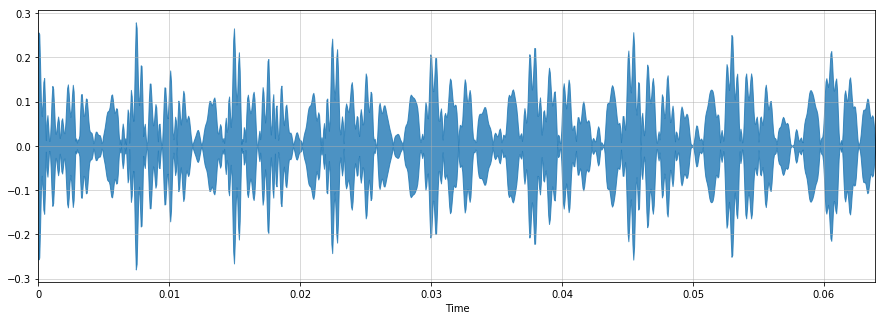

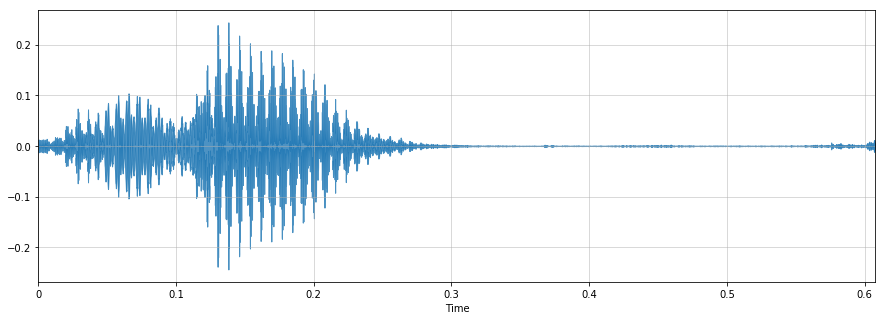

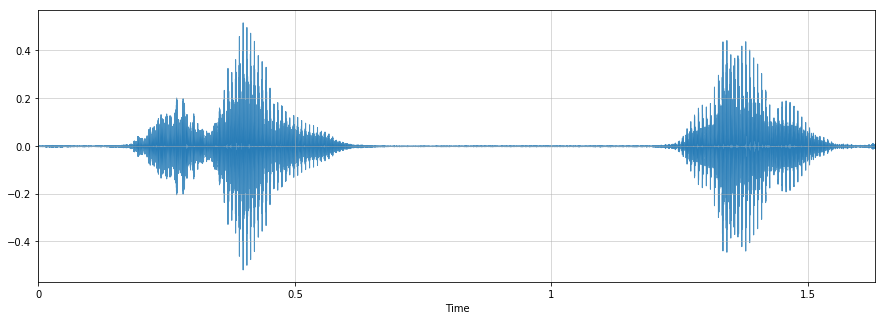

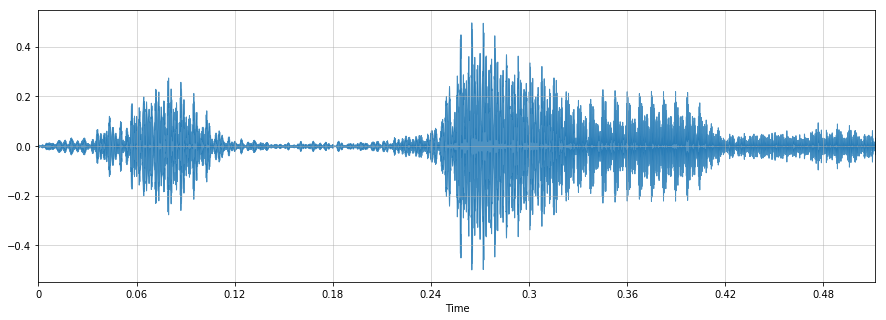

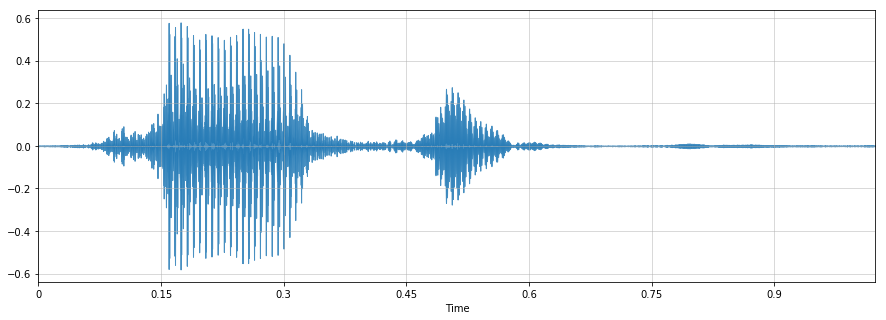

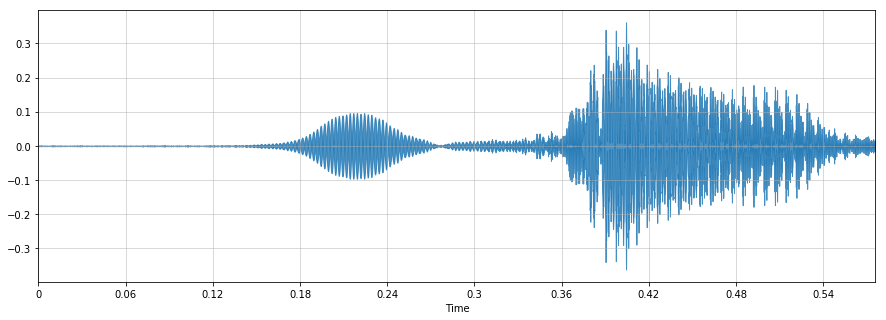

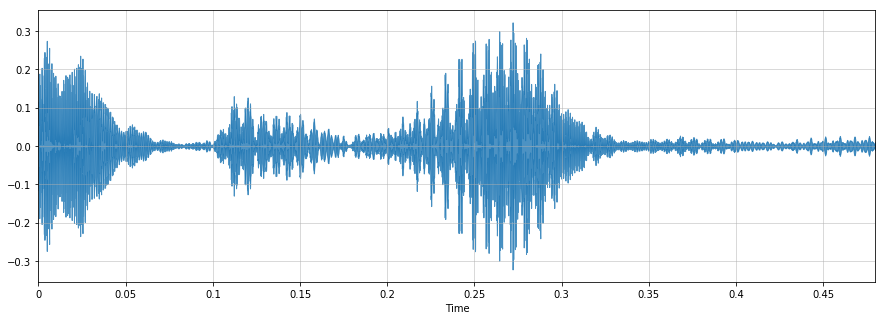

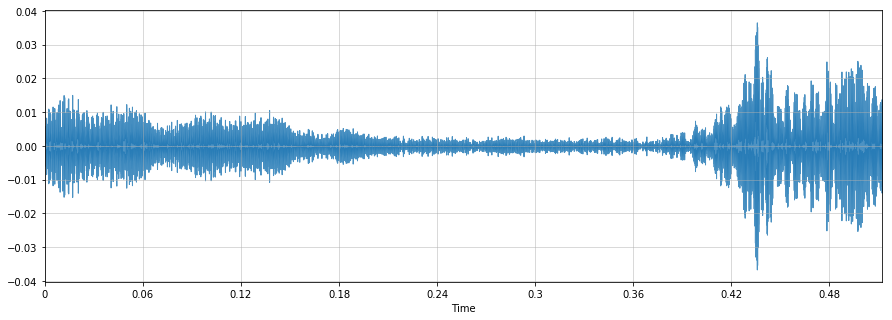

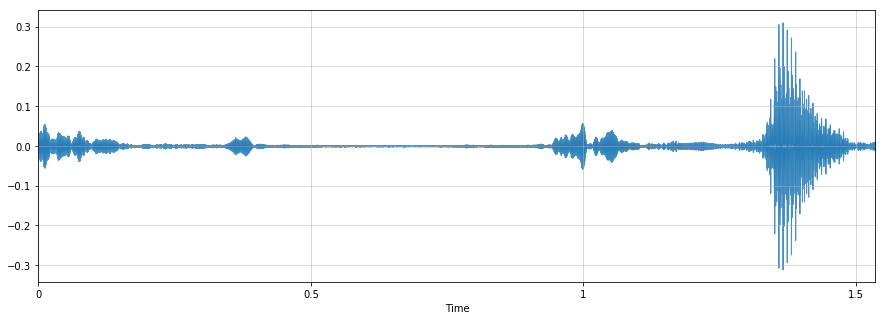

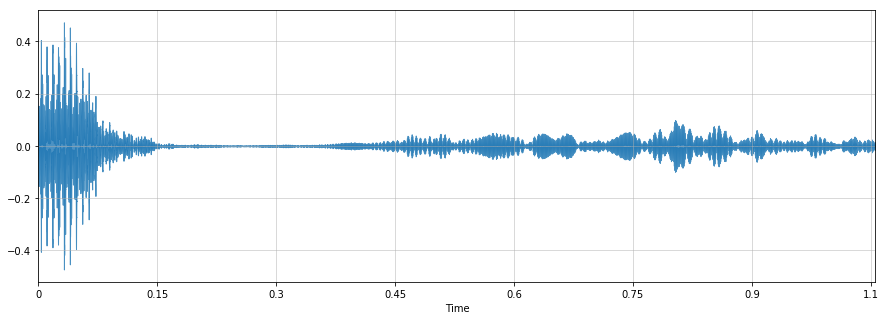

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

In [49]:
for i in main_list_values:
    a = i[0]
    b = i[-1]
    m = x[a:b]
    try:
        plt.figure(figsize=(15, 5))
        librosa.display.waveplot(m, sr, alpha=0.8)
        plt.grid(alpha=0.6)
    except:
        pass
    print()

In [51]:
count = 0
categorize = []
for i in main_list_values:
    print(count," = ",i[-1]-i[0])
    categorize.append(i[-1]-i[0])
    count +=1 

0  =  1024
1  =  9728
2  =  26112
3  =  8192
4  =  16384
5  =  9216
6  =  7680
7  =  8192
8  =  24576
9  =  16896
10  =  3072
11  =  34304
12  =  3072
13  =  8704


In [52]:
min_value = min(categorize)
max_value = max(categorize)
mid_value = int((max_value+min_value)/2)
one_quartile = int((mid_value+min_value)/2)
three_quartile = int((max_value+mid_value)/2)

In [53]:
min_value

1024

In [54]:
one_quartile

9344

In [55]:
mid_value

17664

In [56]:
three_quartile

25984

In [57]:
max_value

34304

In [58]:
cat_1 = []
cat_2 = []
cat_3 = []
cat_4 = []

In [59]:
count = 0
for i in main_list_values:
    value = i[-1]-i[0]
    if value < one_quartile:
        cat_1.append(count)
        count+=1
    elif one_quartile < value < mid_value:
        cat_2.append(count)
        count+=1
    elif mid_value < value < three_quartile:
        cat_3.append(count)
        count+=1
    else:
        cat_4.append(count)
        count+=1

In [60]:
cat_1

[0, 3, 5, 6, 7, 10, 12, 13]

In [61]:
cat_2

[1, 4, 9]

In [62]:
cat_3

[8]

In [63]:
cat_4

[2, 11]

In [64]:
######################################################################################

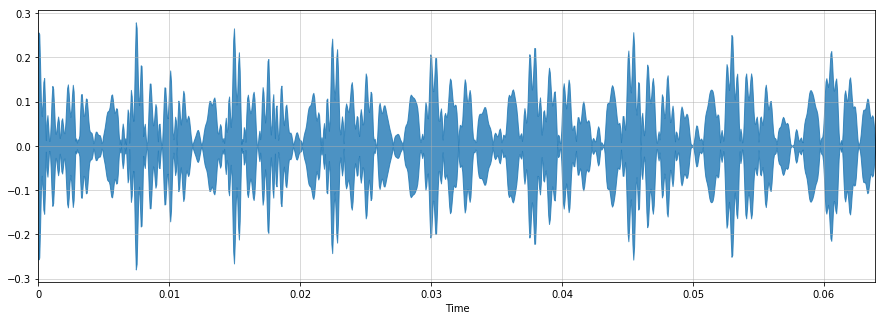

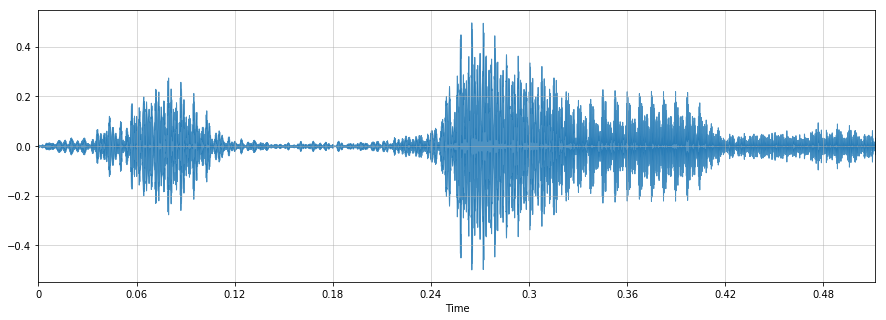

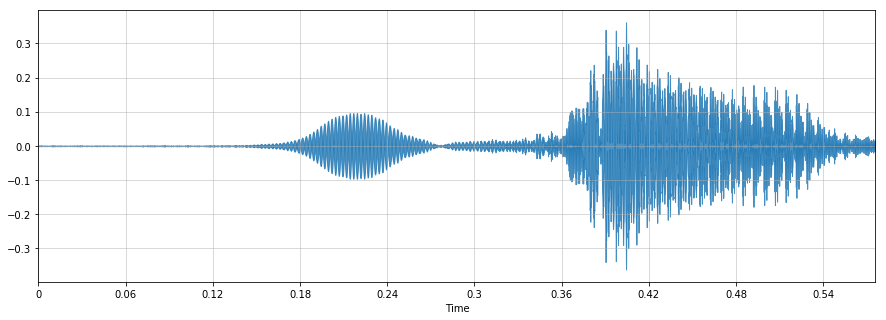

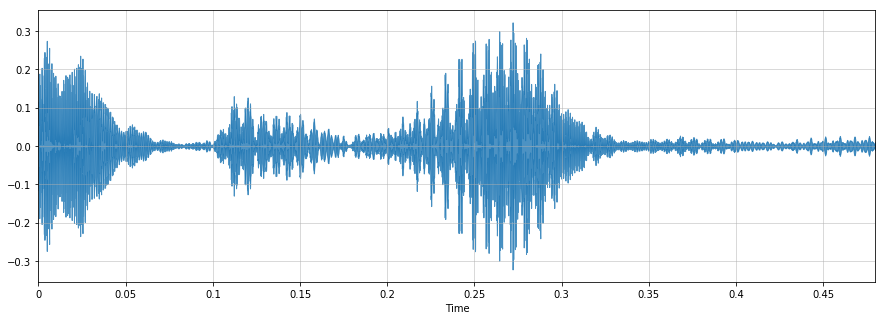

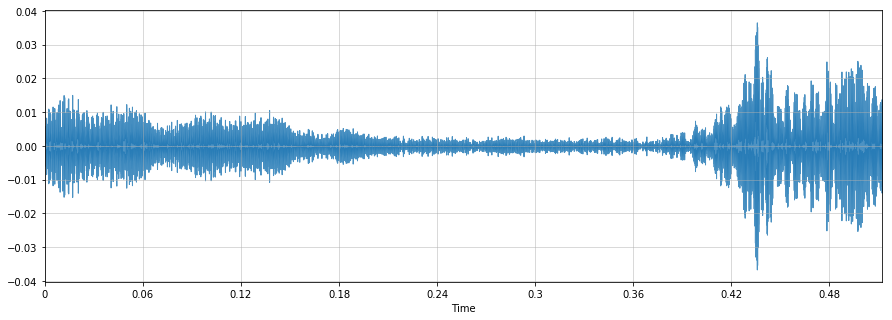

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

In [65]:
count = 0
for i in main_list_values:
    if count in cat_1:
        a = i[0]
        b = i[-1]
        m = x[a:b]
        try:
            plt.figure(figsize=(15, 5))
            librosa.display.waveplot(m, sr, alpha=0.8)
            plt.grid(alpha=0.6)
        except:
            pass
    count += 1

In [66]:
########################################################################################

In [67]:
!pip install python_speech_features

In [68]:
from python_speech_features import mfcc
from python_speech_features import logfbank
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
import numpy as np
import wave

In [69]:
c = []
for i in range(1,10):
    try:
        file = 'audiochunk/chunk'+str(i)+'.wav'
        signal_wave = wave.open(file, 'r')
        sample_rate = 16000
        sig_frequency_data = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
        c.append(sig_frequency_data)
    except:
        print("Total chunk files = ",i-1)
        break

In [70]:
c

[array([  162,   208,   189, ..., -1436, -1453, -1410], dtype=int16),
 array([1495, 1570, 1628, ...,   35,   32,   48], dtype=int16),
 array([29, 24, 27, ..., -2,  5, -2], dtype=int16),
 array([ -7,  -8, -10, ..., -11,  -7,   1], dtype=int16),
 array([ 132,  140,  144, ..., 5226, 5108, 4799], dtype=int16),
 array([  91, -142, -350, ...,  859, 1213, 1370], dtype=int16),
 array([  -7,   -8,   -5, ..., 1456, 1680, 1885], dtype=int16),
 array([ -724,  -708,  -681, ..., -2961, -2219, -1164], dtype=int16),
 array([ -724,  -708,  -681, ..., -2961, -2219, -1164], dtype=int16)]

In [71]:
len(c[0])

16000

In [72]:
c[0][0]

162

In [73]:
result_checker = []
for i in range(len(c)):
    result_checker = []
    for j in range(len(c[0])):
        if c[i][j]-1000 <= c[0][j] <= c[i][j]+1000:
            result_checker.append(1)
        else:
            result_checker.append(0)
    
    p = result_checker.count(1)
    q = len(result_checker)
    print("Percentage Matching b/w Chunk{} and Chunk{} = {}".format(1,i+1,(p/q)*100))

Percentage Matching b/w Chunk1 and Chunk1 = 100.0
Percentage Matching b/w Chunk1 and Chunk2 = 73.75625
Percentage Matching b/w Chunk1 and Chunk3 = 75.13125000000001
Percentage Matching b/w Chunk1 and Chunk4 = 75.04375
Percentage Matching b/w Chunk1 and Chunk5 = 28.762500000000003
Percentage Matching b/w Chunk1 and Chunk6 = 72.39999999999999
Percentage Matching b/w Chunk1 and Chunk7 = 74.925
Percentage Matching b/w Chunk1 and Chunk8 = 65.53125
Percentage Matching b/w Chunk1 and Chunk9 = 65.53125


Explaining the above sample, consider REPETITVE PATTERN matching between CHUNK-1 & CHUNK-2 
then there is a REPETITVE PATTERN WHICH MATCHES UPTO 51.86% 

<h3> <b> So we have tried building a platform where a STUTTERING audio sample is given as input and we first split up audio samples into CHUNKS of audio segments for better understanding and finally we pattern match to find the amount of REPETITIVE SIMILARITY between 2 audio chunks <b> <h3>

In [74]:
result_checker = []
for k in range(len(c)):
    for i in range(len(c)):
        result_checker = []
        for j in range(len(c[0])):
            if c[i][j]-1000 <= c[k][j] <= c[i][j]+1000:
                result_checker.append(1)
            else:
                result_checker.append(0)

        p = result_checker.count(1)
        q = len(result_checker)
        print("Percentage Matching b/w Chunk{0} and Chunk{1} = {2:.2f}%".format(k+1,i+1,(p/q)*100))
    print()

Percentage Matching b/w Chunk1 and Chunk1 = 100.00%
Percentage Matching b/w Chunk1 and Chunk2 = 73.76%
Percentage Matching b/w Chunk1 and Chunk3 = 75.13%
Percentage Matching b/w Chunk1 and Chunk4 = 75.04%
Percentage Matching b/w Chunk1 and Chunk5 = 28.76%
Percentage Matching b/w Chunk1 and Chunk6 = 72.40%
Percentage Matching b/w Chunk1 and Chunk7 = 74.92%
Percentage Matching b/w Chunk1 and Chunk8 = 65.53%
Percentage Matching b/w Chunk1 and Chunk9 = 65.53%

Percentage Matching b/w Chunk2 and Chunk1 = 73.76%
Percentage Matching b/w Chunk2 and Chunk2 = 100.00%
Percentage Matching b/w Chunk2 and Chunk3 = 98.63%
Percentage Matching b/w Chunk2 and Chunk4 = 98.65%
Percentage Matching b/w Chunk2 and Chunk5 = 29.56%
Percentage Matching b/w Chunk2 and Chunk6 = 92.49%
Percentage Matching b/w Chunk2 and Chunk7 = 94.02%
Percentage Matching b/w Chunk2 and Chunk8 = 70.58%
Percentage Matching b/w Chunk2 and Chunk9 = 70.58%

Percentage Matching b/w Chunk3 and Chunk1 = 75.13%
Percentage Matching b/w Chu

In [75]:
######################################################################################

In [76]:
threshhold_percentage = 70

In [77]:
result_checker = []
for k in range(len(c)):
    for i in range(len(c)):
        result_checker = []
        for j in range(len(c[0])):
            if c[i][j]-1000 <= c[k][j] <= c[i][j]+1000:
                result_checker.append(1)
            else:
                result_checker.append(0)

        p = result_checker.count(1)
        q = len(result_checker)
        if ((p/q)*100) > threshhold_percentage:
            print("Percentage Matching b/w Chunk{0} and Chunk{1} = {2:.2f}%".format(k+1,i+1,(p/q)*100))
    print()

Percentage Matching b/w Chunk1 and Chunk1 = 100.00%
Percentage Matching b/w Chunk1 and Chunk2 = 73.76%
Percentage Matching b/w Chunk1 and Chunk3 = 75.13%
Percentage Matching b/w Chunk1 and Chunk4 = 75.04%
Percentage Matching b/w Chunk1 and Chunk6 = 72.40%
Percentage Matching b/w Chunk1 and Chunk7 = 74.92%

Percentage Matching b/w Chunk2 and Chunk1 = 73.76%
Percentage Matching b/w Chunk2 and Chunk2 = 100.00%
Percentage Matching b/w Chunk2 and Chunk3 = 98.63%
Percentage Matching b/w Chunk2 and Chunk4 = 98.65%
Percentage Matching b/w Chunk2 and Chunk6 = 92.49%
Percentage Matching b/w Chunk2 and Chunk7 = 94.02%
Percentage Matching b/w Chunk2 and Chunk8 = 70.58%
Percentage Matching b/w Chunk2 and Chunk9 = 70.58%

Percentage Matching b/w Chunk3 and Chunk1 = 75.13%
Percentage Matching b/w Chunk3 and Chunk2 = 98.63%
Percentage Matching b/w Chunk3 and Chunk3 = 100.00%
Percentage Matching b/w Chunk3 and Chunk4 = 100.00%
Percentage Matching b/w Chunk3 and Chunk6 = 94.95%
Percentage Matching b/w C

In [78]:
file1 = 'chunk1'
file2 = 'chunk3'
file3 = 'chunk8'
file5 = 'chunk9'

In [79]:
f2 = "./audiochunk/"+file2+".wav"
signal_wave = wave.open(f2, 'r')
sample_rate = 16000
sig = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
sig = sig[:]

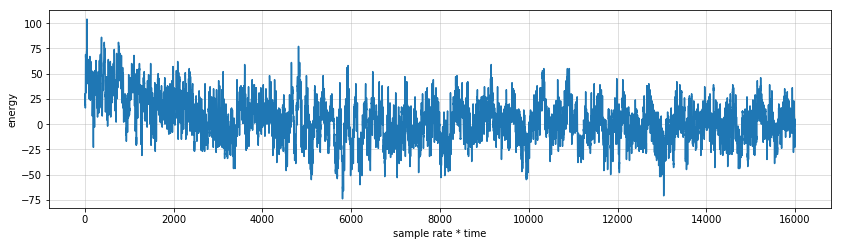

In [80]:
plt.figure(figsize=(14,8))
plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')
plt.grid(alpha=0.5)
plt.show()

In [81]:
f3 = "./audiochunk/"+file3+".wav"
signal_wave = wave.open(f3, 'r')
sample_rate = 16000
sig = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
sig = sig[:]

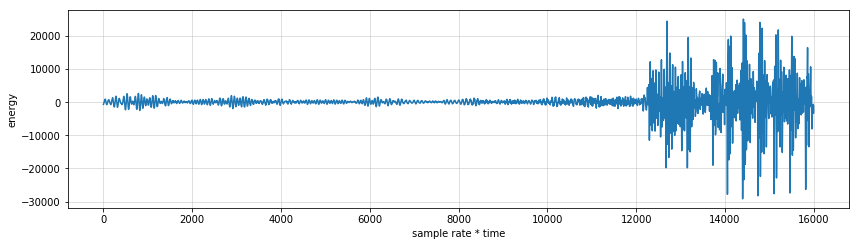

In [82]:
plt.figure(figsize=(14,8))
plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')
plt.grid(alpha=0.5)
plt.show()

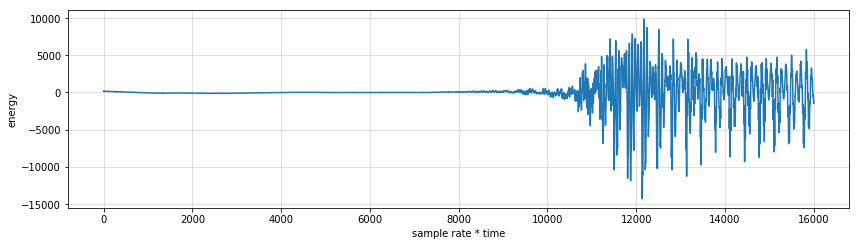

In [83]:
f1 = "./audiochunk/"+file1+".wav"
signal_wave = wave.open(f1, 'r')
sample_rate = 16000
sig = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
sig = sig[:]
plt.figure(figsize=(14,8))
plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')
plt.grid(alpha=0.5)
plt.show()

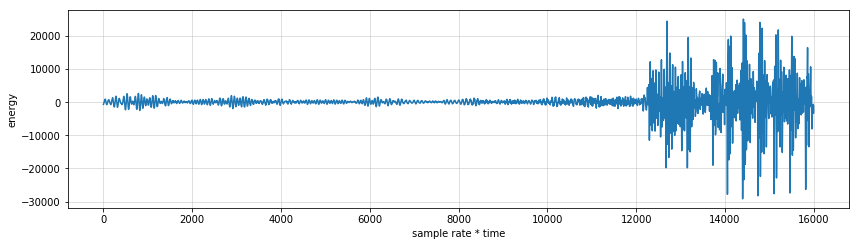

In [84]:
f5 = "./audiochunk/"+file5+".wav"
signal_wave = wave.open(f5, 'r')
sample_rate = 16000
sig = np.frombuffer(signal_wave.readframes(sample_rate), dtype=np.int16)
sig = sig[:]
plt.figure(figsize=(14,8))
plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')
plt.grid(alpha=0.5)
plt.show()